In [1]:
%load_ext autoreload
%reload_ext autoreload
%autoreload 2

from pathlib import Path
import sys; sys.path.insert(0, str(Path('.').resolve().parent / 'src'))
from config import CITIES, CityConfig, DATA_DIR, PLACES_PATH
from geo_utils import *
from plot_utils import *
from eval_utils import *

In [2]:
# Define city configuration
city="chicago"
cfg = CITIES[city]

In [3]:
# Load boundaries
city_gdf = load_city_boundary(cfg)
bg_gdf = load_state_block_groups(cfg)
bg_gdf = label_bgs_within_city(bg_gdf, city_gdf)

Chicago city boundary loaded: 1 row(s)
Chicago state block groups loaded: 9,896
Block groups within city: 2,164 / 9,896


/home/eprashar_solutions_corelogic_com/crime-idx-2026/src/geo_utils.py:25: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  bg['centroid'] = bg.geometry.centroid


Block groups: 9,896 total | 2,164 within city | 7,732 outside


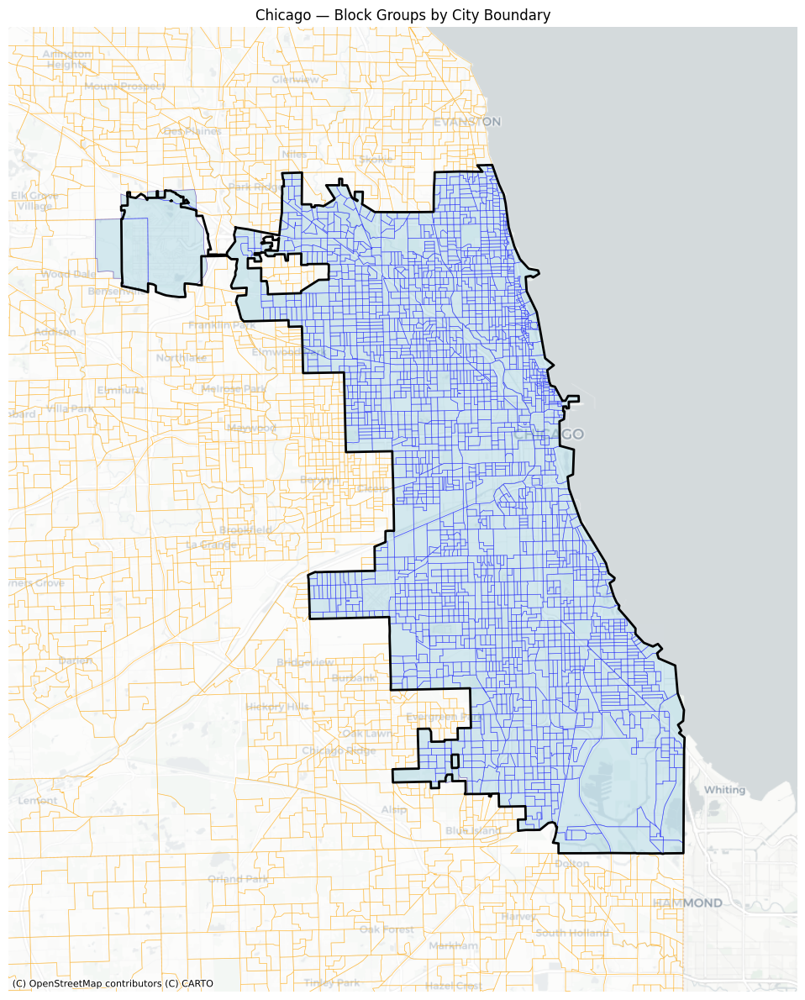

In [4]:
# Map: BGs colored by within/outside city
n_in = (bg_gdf['within_city'] == True).sum()
n_out = (bg_gdf['within_city'] == False).sum()
print(f"Block groups: {len(bg_gdf):,} total | {n_in:,} within city | {n_out:,} outside")
plot_city_with_bgs(bg_gdf, city_gdf, f"{cfg.name} — Block Groups by City Boundary")

In [5]:
# Load crime data
crime_gdf = load_crime_data(cfg)

Chicago crime data: 89,383 rows with valid coords (of 89,393)


Inside city: 89,053 | Outside: 330


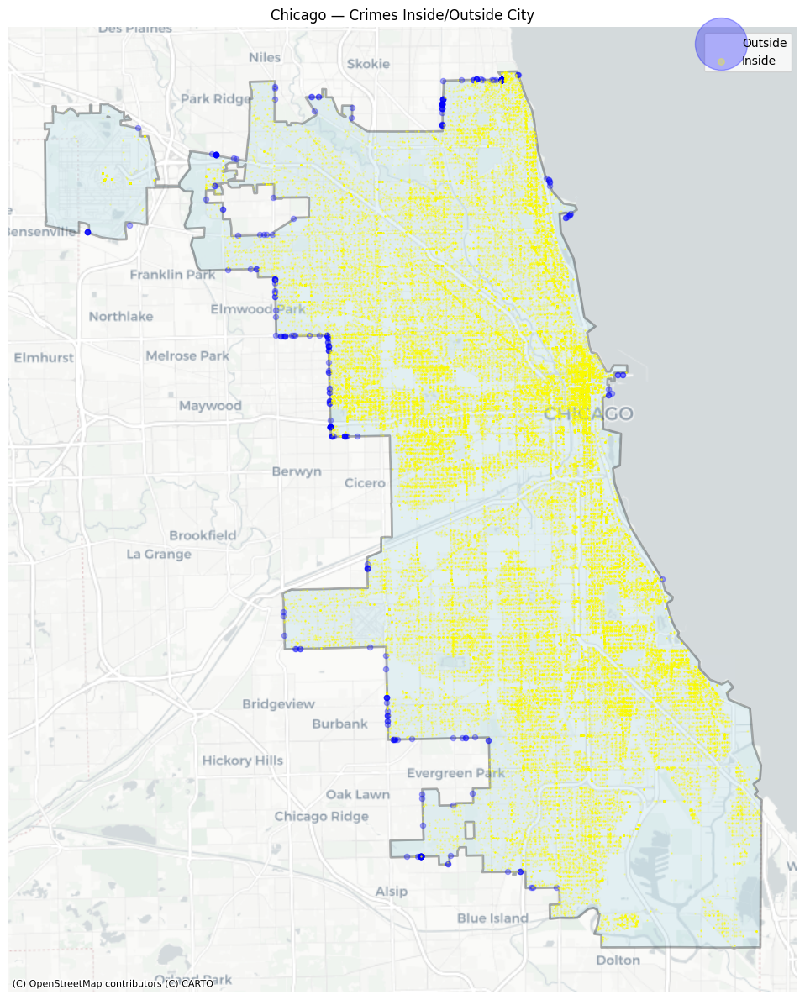

In [6]:
# Spatial join: crimes vs city boundary
inside, outside = sjoin_crimes_to_city(crime_gdf, city_gdf)
plot_crimes_vs_city(inside, outside, city_gdf, f"{cfg.name} — Crimes Inside/Outside City")

Matched to BG: 89,358 | Unmatched: 25
BGs with crimes: 2,234 (2,159 within city, 75 outside)
Crimes inside city: 88,980 | Outside: 378


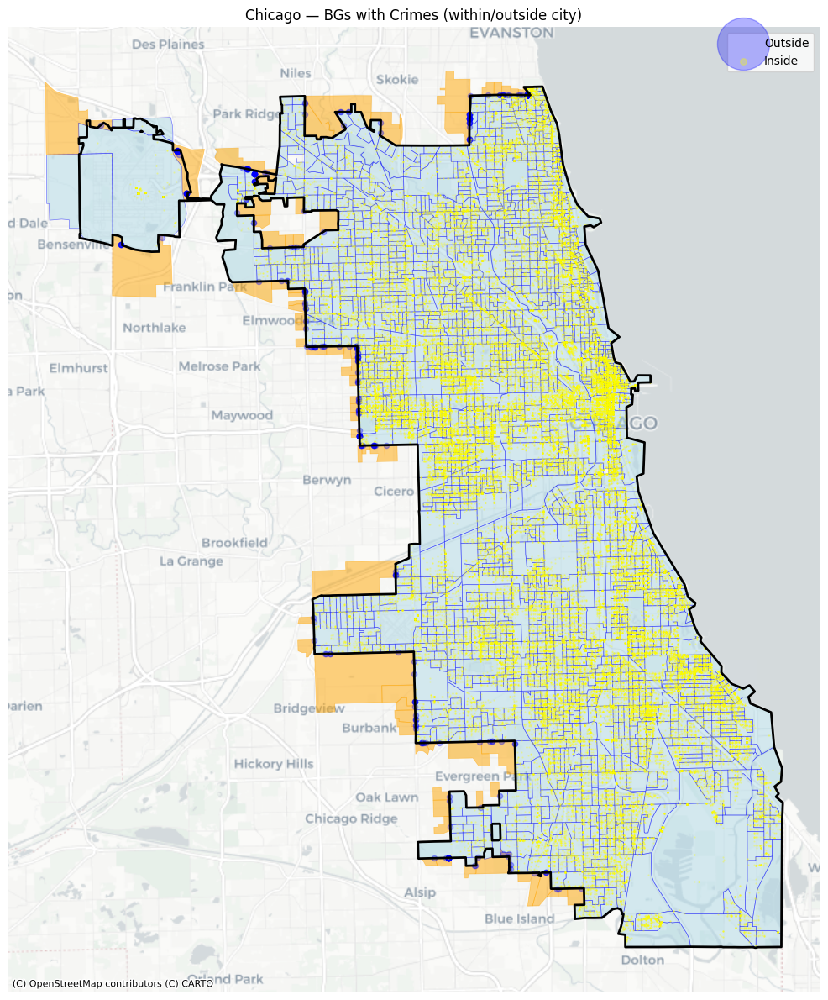

In [7]:
# Spatial join: crimes vs block groups
crime_bg = sjoin_crimes_to_bgs(crime_gdf, bg_gdf)
bg_agg = aggregate_by_bg(crime_bg)

# Crime counts inside/outside city
n_in = (crime_bg['within_city'] == True).sum()
n_out = (crime_bg['within_city'] == False).sum()
print(f"Crimes inside city: {n_in:,} | Outside: {n_out:,}")

plot_bg_crimes(bg_agg, city_gdf, f"{cfg.name} — BGs with Crimes (within/outside city)", crime_bg=crime_bg)

In [8]:
# Map crime categories
crime_bg = map_crime_categories(crime_bg, cfg)
bg_cat = aggregate_by_bg_category(crime_bg)

Mapped: 50,139 / 89,383 (56.1%)
Category counts:
crime_category
larceny     22466
vandal      10276
mvt          6898
assault      5090
burglary     2391
robbery      2034
rape          692
murder        164
fire          128

Unmapped: 39,244 records across 15 codes
BG-level category aggregation: 2,234 BGs (2,159 within city, 75 outside)


In [9]:
# Folium interactive map
folium_bg_crimes(bg_cat, city_gdf, crime_bg, cfg,
                 output_dir=DATA_DIR.parent / 'notebooks' / 'folium_maps')

Saved /home/eprashar_solutions_corelogic_com/crime-idx-2026/notebooks/folium_maps/chicago_bg_crimes.html


In [10]:
# Merge all BGs (including those with zero crime) with category data
bg_all = merge_all_bgs_with_crimes(bg_gdf, bg_cat)

Analysis set: 2,239 BGs
  Inside city:  2,164 (2,159 with data, 5 without)
  Outside city: 75 (all with crime data)



Total Crime Distribution — All BGs (2,239 BGs)
count    2239.00
mean       39.91
std        47.39
min         0.00
25%        16.00
50%        28.00
75%        49.00
max      1118.00
Block groups with zero total: 5 / 2,239 (0.2%)
------------------------------------------------------------
  P 1:        1   (2,234 BGs >= this)
  P 5:        5   (2,138 BGs >= this)
  P10:        8   (2,046 BGs >= this)
  P25:       16   (1,716 BGs >= this)
  P50:       28   (1,160 BGs >= this)
  P75:       49   (583 BGs >= this)
  P90:       80   (226 BGs >= this)
  P95:      105   (112 BGs >= this)
  P99:      191   (25 BGs >= this)


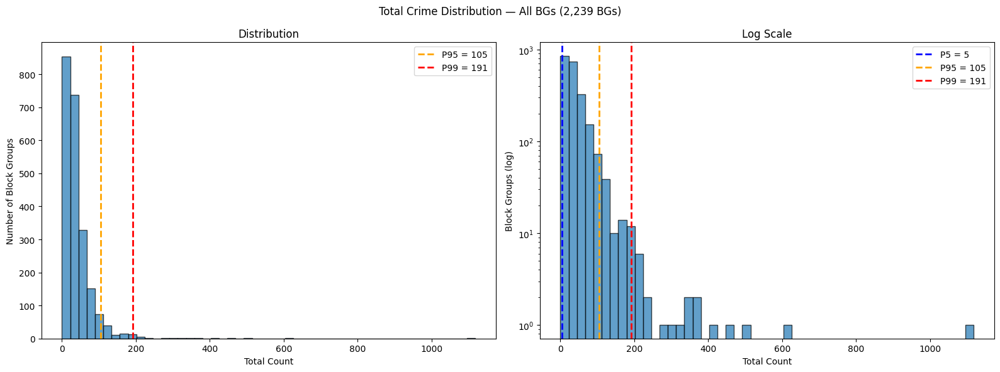


Total Crime Distribution — Inside City (2,164 BGs)
count    2164.000
mean       41.118
std        47.712
min         0.000
25%        17.000
50%        29.000
75%        50.250
max      1118.000
Block groups with zero total: 5 / 2,164 (0.2%)
------------------------------------------------------------
  P 1:        3   (2,143 BGs >= this)
  P 5:        7   (2,066 BGs >= this)
  P10:       10   (1,967 BGs >= this)
  P25:       17   (1,655 BGs >= this)
  P50:       29   (1,113 BGs >= this)
  P75:       50   (541 BGs >= this)
  P90:       80   (226 BGs >= this)
  P95:      106   (112 BGs >= this)
  P99:      191   (25 BGs >= this)


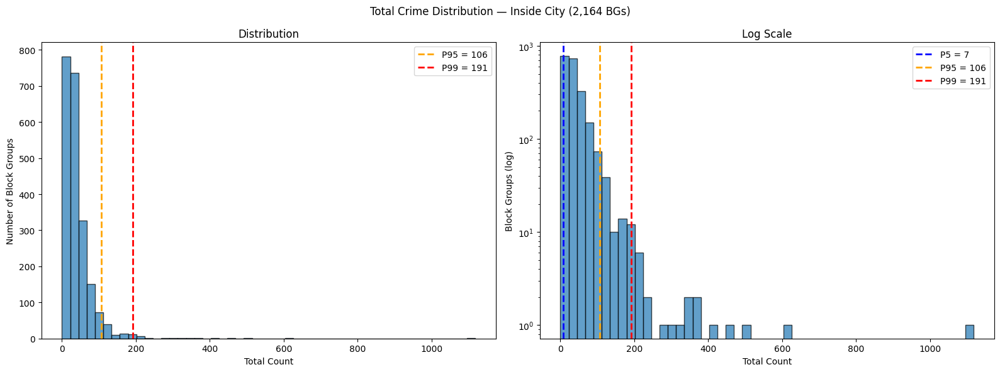


Total Crime Distribution — Outside City (75 BGs)
count    75.000
mean      5.040
std      10.197
min       1.000
25%       1.000
50%       2.000
75%       5.000
max      70.000
Block groups with zero total: 0 / 75 (0.0%)
------------------------------------------------------------
  P 1:        1   (75 BGs >= this)
  P 5:        1   (75 BGs >= this)
  P10:        1   (75 BGs >= this)
  P25:        1   (75 BGs >= this)
  P50:        2   (38 BGs >= this)
  P75:        5   (20 BGs >= this)
  P90:       10   (8 BGs >= this)
  P95:       20   (4 BGs >= this)
  P99:       52   (1 BGs >= this)


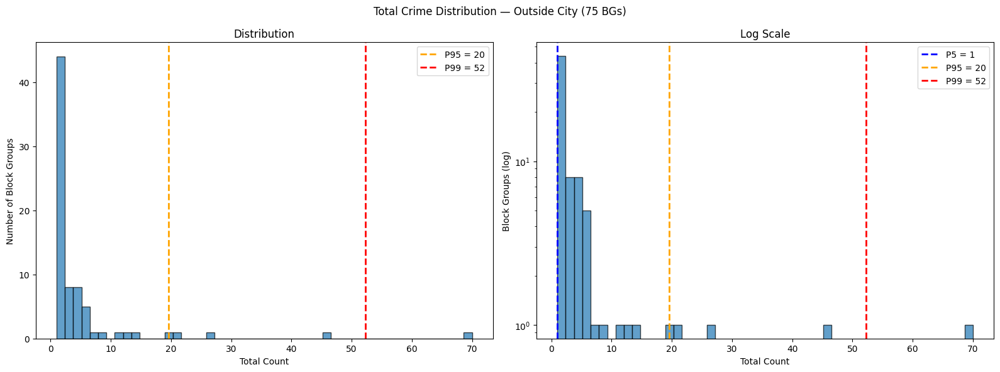

In [11]:
# Now distributions show the full picture including zero-crime BGs
plot_crime_distribution(bg_all, crime_type='total', block_groups='all')
plot_crime_distribution(bg_all, crime_type='total', block_groups='inside')
plot_crime_distribution(bg_all, crime_type='total', block_groups='outside')

In [32]:
bg_cat_inside.head()

,bg_key,bg_geo,total_count,within_city,assault_count,burglary_count,fire_count,larceny_count,murder_count,mvt_count,rape_count,robbery_count,vandal_count,violent_count,property_count,county_fips
0,170310101001,"POLYGON ((-87.67115 42.02304, -87.66615 42.023...",19,True,1.0,0.0,0.0,6.0,0.0,1.0,0.0,0.0,2.0,1.0,7.0,17031
1,170310101002,"POLYGON ((-87.6772 42.02294, -87.67188 42.0229...",137,True,9.0,2.0,1.0,23.0,0.0,6.0,0.0,1.0,13.0,10.0,31.0,17031
2,170310101003,"POLYGON ((-87.66948 42.02114, -87.66658 42.021...",31,True,2.0,1.0,0.0,8.0,0.0,3.0,0.0,0.0,0.0,2.0,12.0,17031
3,170310102011,"POLYGON ((-87.68408 42.01515, -87.68301 42.015...",20,True,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,4.0,0.0,5.0,17031
4,170310102012,"POLYGON ((-87.68039 42.0136, -87.67905 42.0142...",22,True,1.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,2.0,1.0,7.0,17031


In [33]:
# Check percentage of different crime types
bg_cat_inside = bg_cat[bg_cat['within_city'] == True]
total_crimes = bg_cat_inside['total_count'].sum()
print(f"Total crimes inside city: {total_crimes:,.0f}")
categories_pct = [
    'murder_count',
    'fire_count',
    'vandal_count',
    'rape_count',
    'assault_count',
    'larceny_count',
    'burglary_count',
    'robbery_count',
    'mvt_count',
    'violent_count',
    'property_count'
    ]

for col in categories_pct:
    if col in bg_cat_inside.columns:
        val = bg_cat_inside[col].sum()
        print(f"{col.replace('_count',''):>12}: {val:>10,.0f}  ({val/total_crimes*100:>5.1f}%)")

print(f"{'total':>12}: {total_crimes:>10,.0f}  (100.0%)")

Total crimes inside city: 88,980
      murder:        163  (  0.2%)
        fire:        128  (  0.1%)
      vandal:     10,253  ( 11.5%)
        rape:        690  (  0.8%)
     assault:      5,071  (  5.7%)
     larceny:     22,357  ( 25.1%)
    burglary:      2,377  (  2.7%)
     robbery:      2,023  (  2.3%)
         mvt:      6,866  (  7.7%)
     violent:      7,947  (  8.9%)
    property:     31,600  ( 35.5%)
       total:     88,980  (100.0%)



Assault Crime Distribution — All BGs (2,234 BGs)
count    2234.000
mean        2.278
std         2.956
min         0.000
25%         0.000
50%         1.000
75%         3.000
max        35.000
Block groups with zero assault: 737 / 2,234 (33.0%)
------------------------------------------------------------
  P 1:        0   (2,234 BGs >= this)
  P 5:        0   (2,234 BGs >= this)
  P10:        0   (2,234 BGs >= this)
  P25:        0   (2,234 BGs >= this)
  P50:        1   (1,497 BGs >= this)
  P75:        3   (740 BGs >= this)
  P90:        6   (251 BGs >= this)
  P95:        8   (136 BGs >= this)
  P99:       13   (30 BGs >= this)


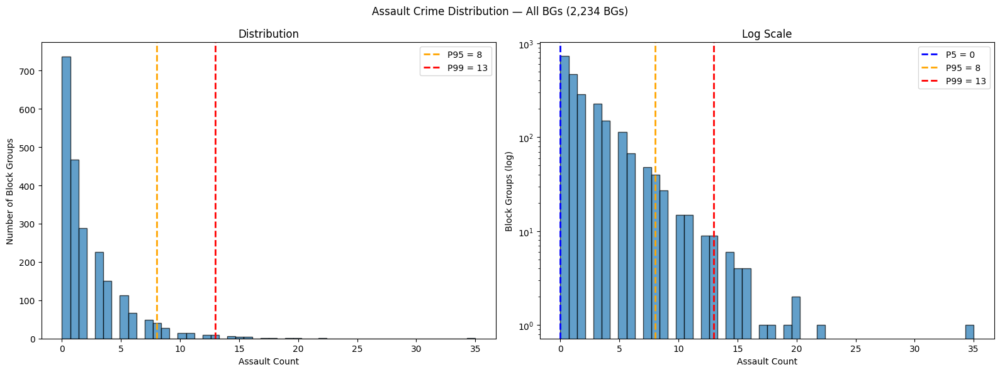


Assault Crime Distribution — Inside City (2,159 BGs)
count    2159.000
mean        2.349
std         2.980
min         0.000
25%         0.000
50%         1.000
75%         3.000
max        35.000
Block groups with zero assault: 675 / 2,159 (31.3%)
------------------------------------------------------------
  P 1:        0   (2,159 BGs >= this)
  P 5:        0   (2,159 BGs >= this)
  P10:        0   (2,159 BGs >= this)
  P25:        0   (2,159 BGs >= this)
  P50:        1   (1,484 BGs >= this)
  P75:        3   (739 BGs >= this)
  P90:        6   (251 BGs >= this)
  P95:        8   (136 BGs >= this)
  P99:       13   (30 BGs >= this)


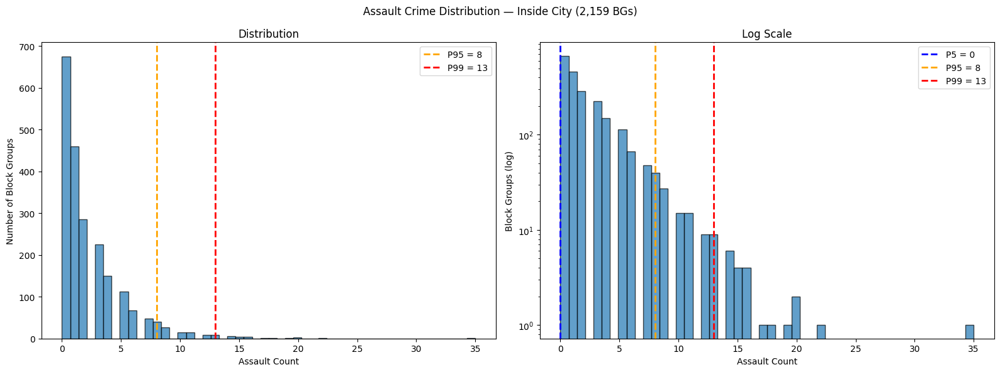


Assault Crime Distribution — Outside City (75 BGs)
count    75.000
mean      0.240
std       0.589
min       0.000
25%       0.000
50%       0.000
75%       0.000
max       3.000
Block groups with zero assault: 62 / 75 (82.7%)
------------------------------------------------------------
  P 1:        0   (75 BGs >= this)
  P 5:        0   (75 BGs >= this)
  P10:        0   (75 BGs >= this)
  P25:        0   (75 BGs >= this)
  P50:        0   (75 BGs >= this)
  P75:        0   (75 BGs >= this)
  P90:        1   (13 BGs >= this)
  P95:        1   (4 BGs >= this)
  P99:        2   (1 BGs >= this)


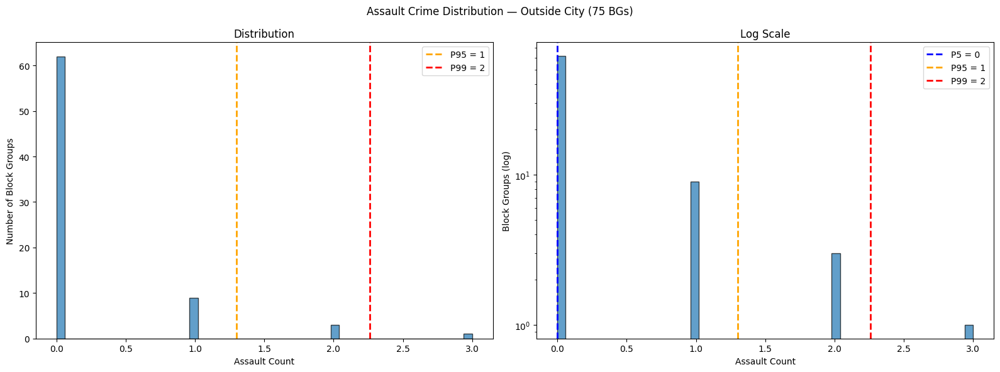

In [13]:
# Distribution by crime type 
# Example: assault distribution inside vs outside city
for scope in ['all', 'inside', 'outside']:
    plot_crime_distribution(bg_cat, crime_type='assault', block_groups=scope)

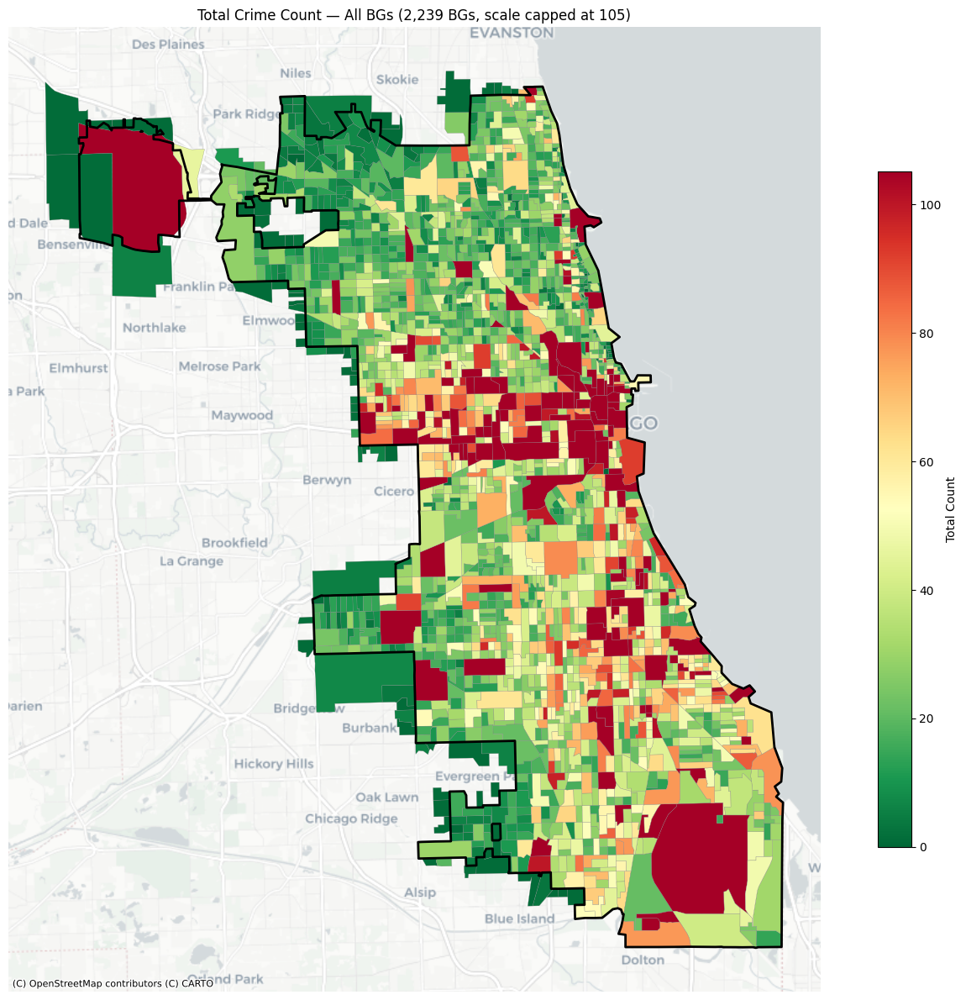

In [14]:
# Choropleth: total crime counts for all BGs
plot_bg_choropleth(bg_all, city_gdf, crime_type='total', block_groups='all', 
                   cmap='RdYlGn_r', vmax=95)

##### Some cool experimentation to understand spatial patterns in crime

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse

def std_deviational_ellipse(gdf, weight_col='total_count', crs_proj="EPSG:3857"):
    """
    Compute Standard Deviational Ellipse from block group centroids weighted by crime counts.
    
    Parameters
    ----------
    gdf : GeoDataFrame with polygon geometry and a weight column
    weight_col : column name for crime counts (weights)
    crs_proj : projected CRS for distance calculations (meters)
    
    Returns
    -------
    dict with keys: center_x, center_y, sigma_major, sigma_minor, angle_deg, axis_ratio
    """
    # Project to meters for meaningful distances
    proj = gdf.to_crs(crs_proj)
    centroids = proj.geometry.centroid
    
    x = centroids.x.values
    y = centroids.y.values
    w = gdf[weight_col].values.astype(float)
    
    # Exclude zero-weight BGs
    mask = w > 0
    x, y, w = x[mask], y[mask], w[mask]
    w_norm = w / w.sum()
    
    # Weighted mean center
    cx = np.average(x, weights=w_norm)
    cy = np.average(y, weights=w_norm)
    
    # Deviations
    dx = x - cx
    dy = y - cy
    
    # Weighted variance-covariance matrix
    var_x = np.average(dx**2, weights=w_norm)
    var_y = np.average(dy**2, weights=w_norm)
    cov_xy = np.average(dx * dy, weights=w_norm)
    
    cov_matrix = np.array([[var_x, cov_xy], [cov_xy, var_y]])
    eigvals, eigvecs = np.linalg.eigh(cov_matrix)
    
    # eigh returns eigenvalues in ascending order
    sigma_minor = np.sqrt(eigvals[0])
    sigma_major = np.sqrt(eigvals[1])
    
    # Angle of the major axis (from x-axis, counterclockwise)
    angle = np.degrees(np.arctan2(eigvecs[1, 1], eigvecs[0, 1]))
    
    return {
        'center_x': cx, 'center_y': cy,
        'sigma_major': sigma_major,  # meters
        'sigma_minor': sigma_minor,  # meters
        'angle_deg': angle,
        'axis_ratio': sigma_major / sigma_minor,  # >1 = elongated/directional
    }

# --- Usage in your notebook ---
inside_bgs = bg_all[bg_all['within_city'] == True].copy()
result = std_deviational_ellipse(inside_bgs, weight_col='total_count')

print(f"Mean center (projected): ({result['center_x']:.0f}, {result['center_y']:.0f})")
print(f"Major axis σ: {result['sigma_major']:.0f} m")
print(f"Minor axis σ: {result['sigma_minor']:.0f} m")
print(f"Orientation:  {result['angle_deg']:.1f}°")
print(f"Axis ratio:   {result['axis_ratio']:.2f}")  # Houston ≈ 1.x (circular), Chicago ≈ 2+ (directional)

Mean center (projected): (-9759049, 5137945)
Major axis σ: 13419 m
Minor axis σ: 5359 m
Orientation:  107.8°
Axis ratio:   2.50


In [29]:
# 1. Baseline: SDE of city BGs with EQUAL weights (= pure city shape)
inside_bgs['uniform'] = 1.0
baseline = std_deviational_ellipse(inside_bgs, weight_col='uniform')

# 2. Crime-weighted SDE (what you already have)
crime_sde = std_deviational_ellipse(inside_bgs, weight_col='total_count')

# 3. Compare
print(f"{'Metric':<20} {'City Shape':<15} {'Crime-Weighted':<15}")
print(f"{'Axis ratio':<20} {baseline['axis_ratio']:<15.2f} {crime_sde['axis_ratio']:<15.2f}")
print(f"{'Angle (°)':<20} {baseline['angle_deg']:<15.1f} {crime_sde['angle_deg']:<15.1f}")
print(f"{'Major σ (m)':<20} {baseline['sigma_major']:<15.0f} {crime_sde['sigma_major']:<15.0f}")
print(f"{'Minor σ (m)':<20} {baseline['sigma_minor']:<15.0f} {crime_sde['sigma_minor']:<15.0f}")

# Relative directionality: how much MORE directional is crime vs. the city shape?
relative_ratio = crime_sde['axis_ratio'] / baseline['axis_ratio']
angle_diff = crime_sde['angle_deg'] - baseline['angle_deg']
print(f"\nRelative axis ratio (crime / shape): {relative_ratio:.2f}")
print(f"Angle difference: {angle_diff:.1f}°")

Metric               City Shape      Crime-Weighted 
Axis ratio           2.53            2.50           
Angle (°)            106.3           107.8          
Major σ (m)          14570           13419          
Minor σ (m)          5759            5359           

Relative axis ratio (crime / shape): 0.99
Angle difference: 1.5°


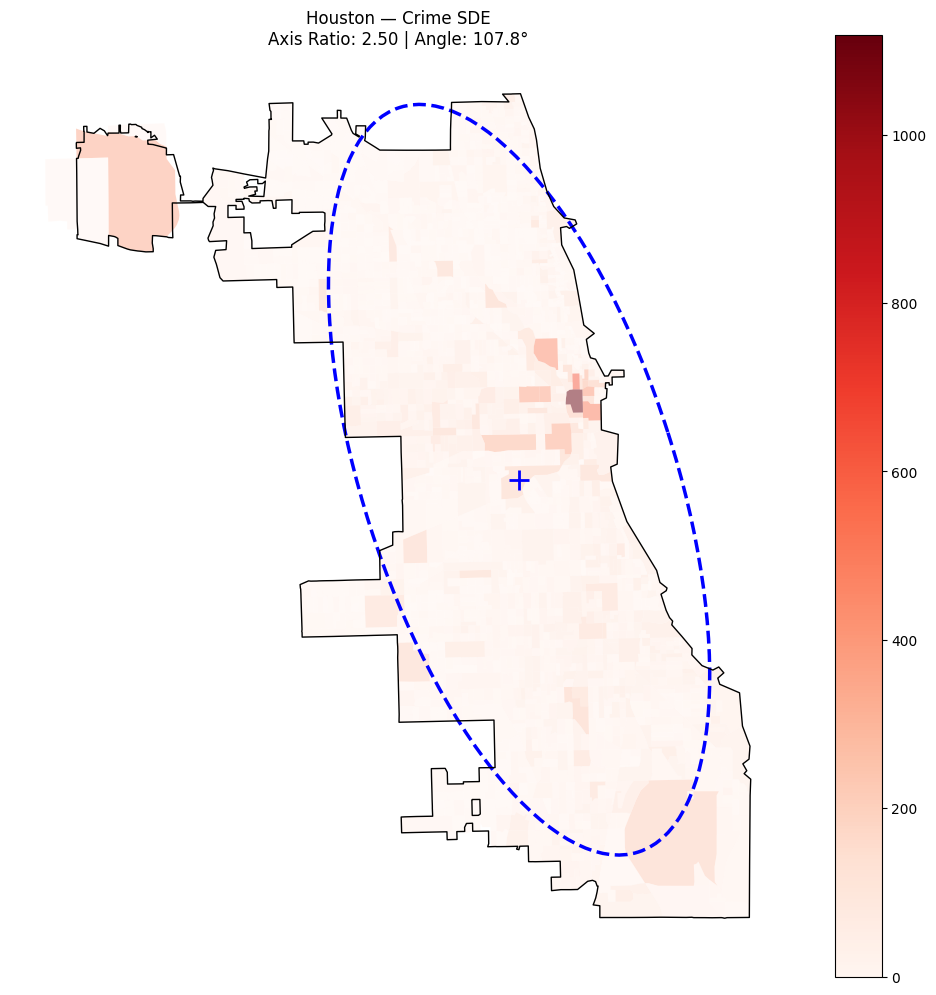

In [28]:
def plot_sde(gdf, city_gdf, weight_col='total_count', title='Standard Deviational Ellipse'):
    proj_crs = "EPSG:3857"
    result = std_deviational_ellipse(gdf, weight_col, crs_proj=proj_crs)
    
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    gdf.to_crs(proj_crs).plot(ax=ax, column=weight_col, cmap='Reds', alpha=0.5, legend=True)
    city_gdf.to_crs(proj_crs).boundary.plot(ax=ax, color='black', linewidth=1)
    
    # Draw ellipse (2σ covers ~95% of weighted distribution)
    ellipse = Ellipse(
        (result['center_x'], result['center_y']),
        width=2 * result['sigma_major'] * 2,   # 2σ diameter
        height=2 * result['sigma_minor'] * 2,
        angle=result['angle_deg'],
        fill=False, edgecolor='blue', linewidth=2.5, linestyle='--'
    )
    ax.add_patch(ellipse)
    ax.plot(result['center_x'], result['center_y'], 'b+', markersize=15, markeredgewidth=2)
    ax.set_title(f"{title}\nAxis Ratio: {result['axis_ratio']:.2f} | Angle: {result['angle_deg']:.1f}°")
    ax.set_axis_off()
    plt.tight_layout()
    plt.show()

plot_sde(inside_bgs, city_gdf, weight_col='total_count', title='Houston — Crime SDE')

/tmp/ipykernel_553614/140581835.py:5: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = Queen.from_dataframe(inside_bgs)
/home/eprashar_solutions_corelogic_com/.cache/pypoetry/virtualenvs/crime-idx-2026-v3aYThD0-py3.12/lib/python3.12/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  W.__init__(self, neighbors, ids=ids, **kw)


Global Moran's I: 0.365 (p=0.0010)


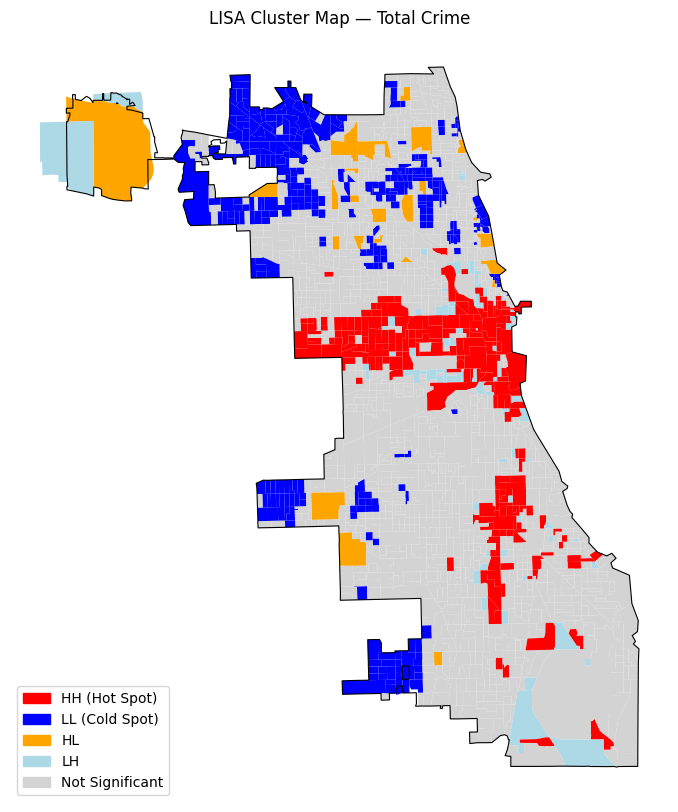

In [30]:
from esda.moran import Moran, Moran_Local
from libpysal.weights import Queen

# Spatial weights (adjacency)
w = Queen.from_dataframe(inside_bgs)
w.transform = 'r'  # row-standardize

y = inside_bgs['total_count'].values

# --- Global ---
mi = Moran(y, w, permutations=999)
print(f"Global Moran's I: {mi.I:.3f} (p={mi.p_sim:.4f})")
# Higher I = more clustered. Compare this number across cities.

# --- Local (LISA) ---
lisa = Moran_Local(y, w, permutations=999)
inside_bgs['lisa_I'] = lisa.Is           # local I value
inside_bgs['lisa_q'] = lisa.q            # quadrant (1=HH, 2=LH, 3=LL, 4=HL)
inside_bgs['lisa_sig'] = lisa.p_sim < 0.05  # significant at 5%

# LISA cluster map
labels = {1: 'HH (Hot Spot)', 2: 'LH', 3: 'LL (Cold Spot)', 4: 'HL'}
inside_bgs['cluster'] = inside_bgs.apply(
    lambda r: labels[r['lisa_q']] if r['lisa_sig'] else 'Not Significant', axis=1
)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
colors = {'HH (Hot Spot)': 'red', 'LL (Cold Spot)': 'blue', 
           'HL': 'orange', 'LH': 'lightblue', 'Not Significant': 'lightgrey'}
inside_bgs.plot(ax=ax, color=inside_bgs['cluster'].map(colors), edgecolor='none')
city_gdf.boundary.plot(ax=ax, color='black', linewidth=0.8)
ax.set_title("LISA Cluster Map — Total Crime")
ax.set_axis_off()
# Add legend
from matplotlib.patches import Patch
legend_patches = [Patch(color=v, label=k) for k, v in colors.items()]
ax.legend(handles=legend_patches, loc='lower left')
plt.show()

In [15]:
# Load model data and merge with analysis set
crisk_df = load_model_data(bg_all)
comparison = merge_model_with_actuals(bg_all, crisk_df)
comparison = normalize_actuals(comparison)

Model loaded: 300,363 total BGs, 2,239 matched to analysis set
Merged comparison set: 2,239 BGs
  Inside city: 2,164 | Outside: 75
Normalized actuals to rate/1K: 2,236 BGs with population > 0



Model Total Score Distribution — All BGs (2,239 BGs)
count    2239.000
mean       53.610
std        35.017
min         4.789
25%        29.828
50%        42.027
75%        67.376
max       269.467
Block groups with zero total score: 0 / 2,239 (0.0%)
------------------------------------------------------------
  P 1:     11.636   (2,216 BGs >= this)
  P 5:     17.367   (2,127 BGs >= this)
  P10:     21.531   (2,015 BGs >= this)
  P25:     29.828   (1,679 BGs >= this)
  P50:     42.027   (1,120 BGs >= this)
  P75:     67.376   (560 BGs >= this)
  P90:    107.166   (224 BGs >= this)
  P95:    126.941   (112 BGs >= this)
  P99:    170.719   (23 BGs >= this)


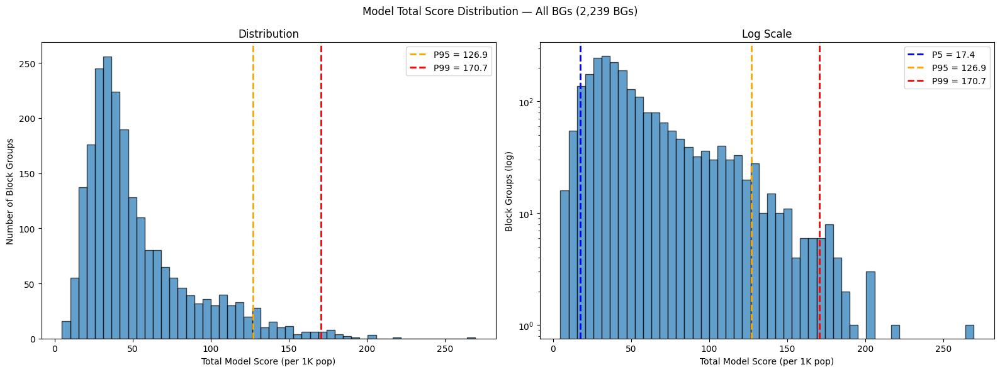


Model Total Score Distribution — Inside City (2,164 BGs)
count    2164.000
mean       54.653
std        35.051
min         8.243
25%        30.640
50%        42.936
75%        68.259
max       269.467
Block groups with zero total score: 0 / 2,164 (0.0%)
------------------------------------------------------------
  P 1:     13.412   (2,142 BGs >= this)
  P 5:     18.639   (2,055 BGs >= this)
  P10:     22.546   (1,947 BGs >= this)
  P25:     30.640   (1,623 BGs >= this)
  P50:     42.936   (1,082 BGs >= this)
  P75:     68.259   (541 BGs >= this)
  P90:    108.418   (217 BGs >= this)
  P95:    127.575   (109 BGs >= this)
  P99:    170.909   (22 BGs >= this)


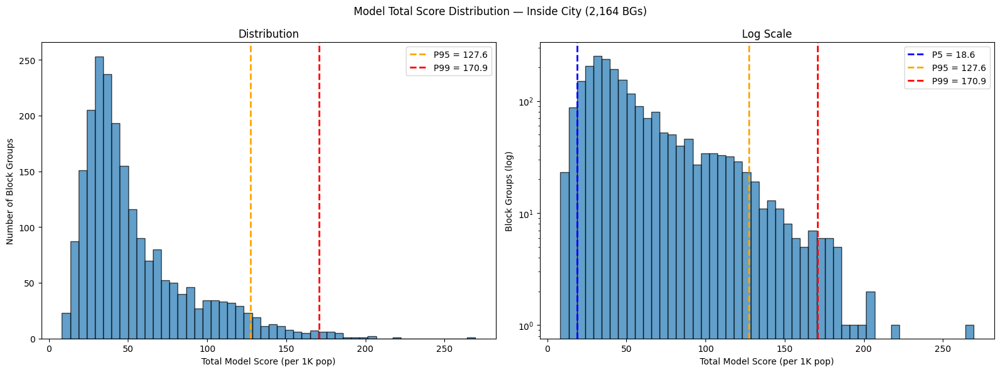


Model Total Score Distribution — Outside City (75 BGs)
count    75.000
mean     23.511
std      14.945
min       4.789
25%      13.478
50%      18.480
75%      29.028
max      69.342
Block groups with zero total score: 0 / 75 (0.0%)
------------------------------------------------------------
  P 1:      5.917   (74 BGs >= this)
  P 5:      7.195   (71 BGs >= this)
  P10:      8.555   (67 BGs >= this)
  P25:     13.478   (56 BGs >= this)
  P50:     18.480   (38 BGs >= this)
  P75:     29.028   (19 BGs >= this)
  P90:     41.670   (8 BGs >= this)
  P95:     54.691   (4 BGs >= this)
  P99:     67.460   (1 BGs >= this)


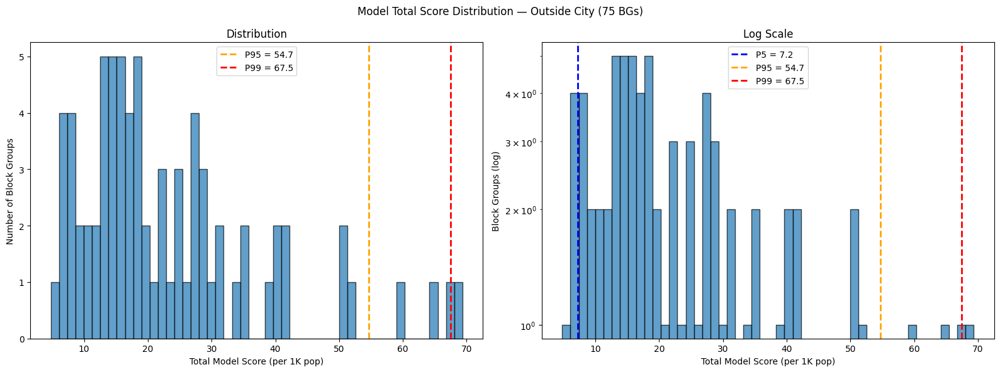

In [16]:
# Model score distributions
for scope in ['all', 'inside', 'outside']:
    plot_model_distribution(comparison, crime_type='total', block_groups=scope)

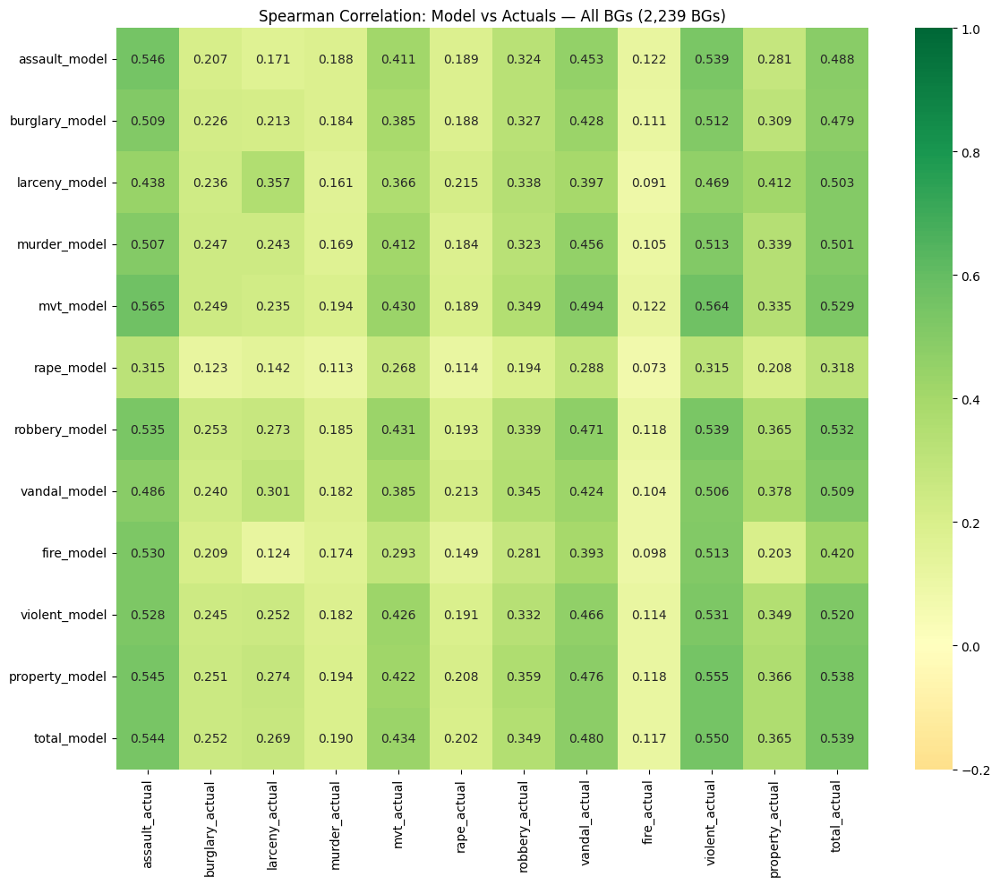


Same-category Spearman correlations (All BGs):
     assault: 0.546
    burglary: 0.226
     larceny: 0.357
      murder: 0.169
         mvt: 0.430
        rape: 0.114
     robbery: 0.339
      vandal: 0.424
        fire: 0.098
     violent: 0.531
    property: 0.366
       total: 0.539


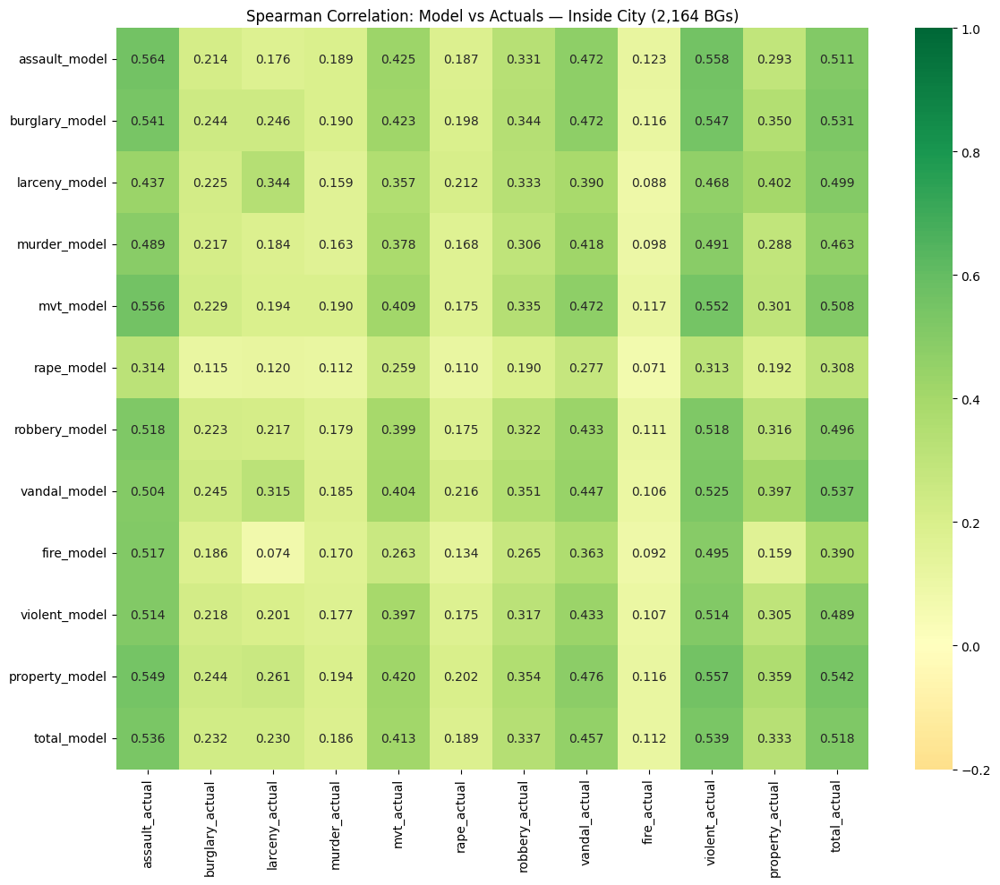


Same-category Spearman correlations (Inside City):
     assault: 0.564
    burglary: 0.244
     larceny: 0.344
      murder: 0.163
         mvt: 0.409
        rape: 0.110
     robbery: 0.322
      vandal: 0.447
        fire: 0.092
     violent: 0.514
    property: 0.359
       total: 0.518


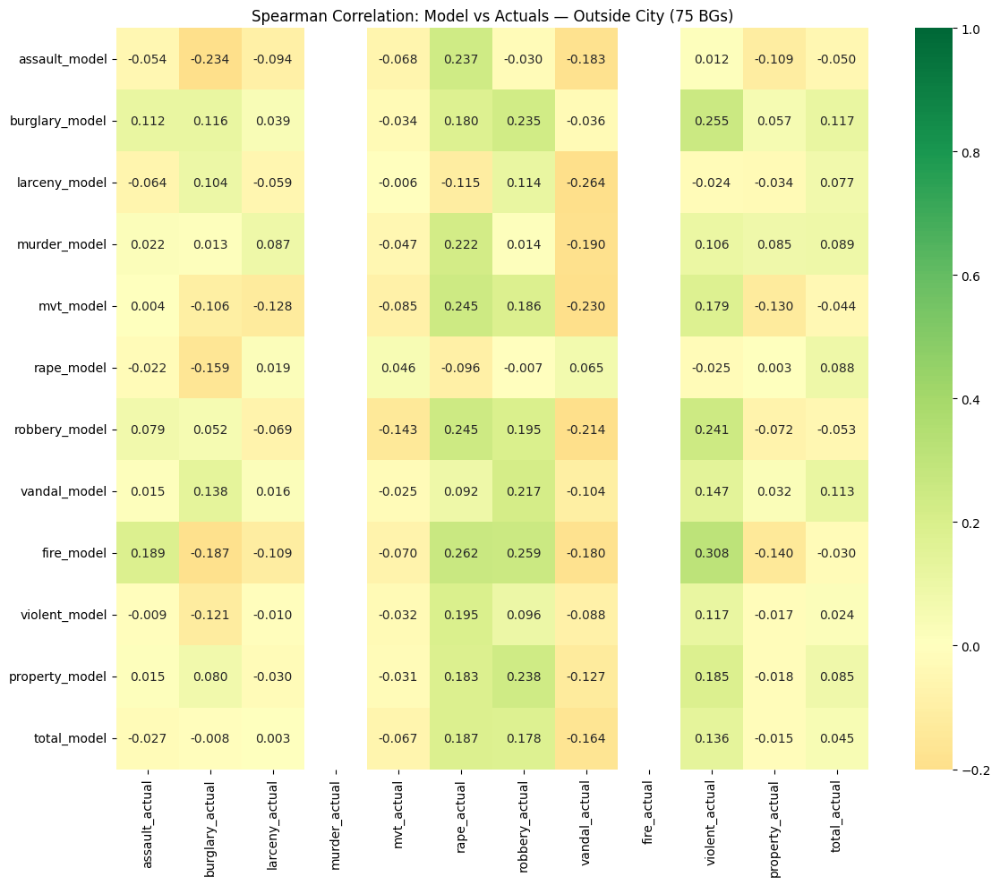


Same-category Spearman correlations (Outside City):
     assault: -0.054
    burglary: 0.116
     larceny: -0.059
      murder: nan
         mvt: -0.085
        rape: -0.096
     robbery: 0.195
      vandal: -0.104
        fire: nan
     violent: 0.117
    property: -0.018
       total: 0.045


In [17]:
# Spearman correlation heatmaps: model vs actuals
for scope in ['all', 'inside', 'outside']:
    plot_correlation_heatmap(comparison, block_groups=scope)

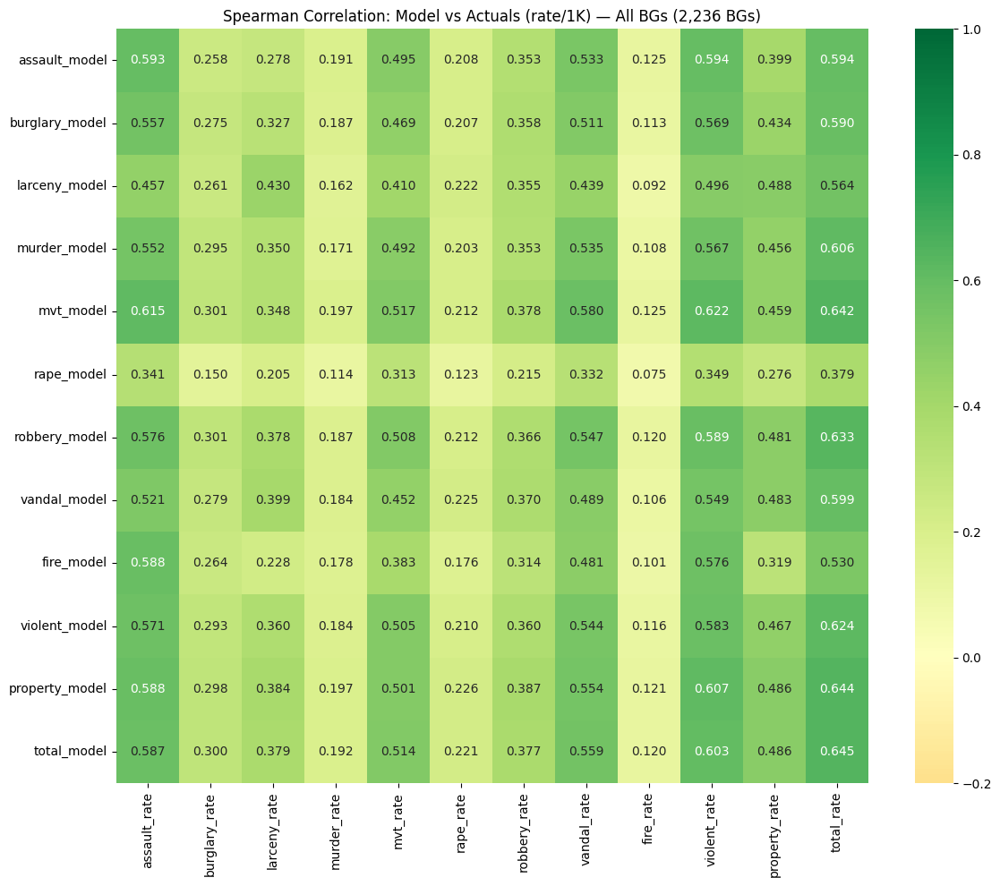


Same-category Spearman correlations — normalized (All BGs):
     assault: 0.593
    burglary: 0.275
     larceny: 0.430
      murder: 0.171
         mvt: 0.517
        rape: 0.123
     robbery: 0.366
      vandal: 0.489
        fire: 0.101
     violent: 0.583
    property: 0.486
       total: 0.645


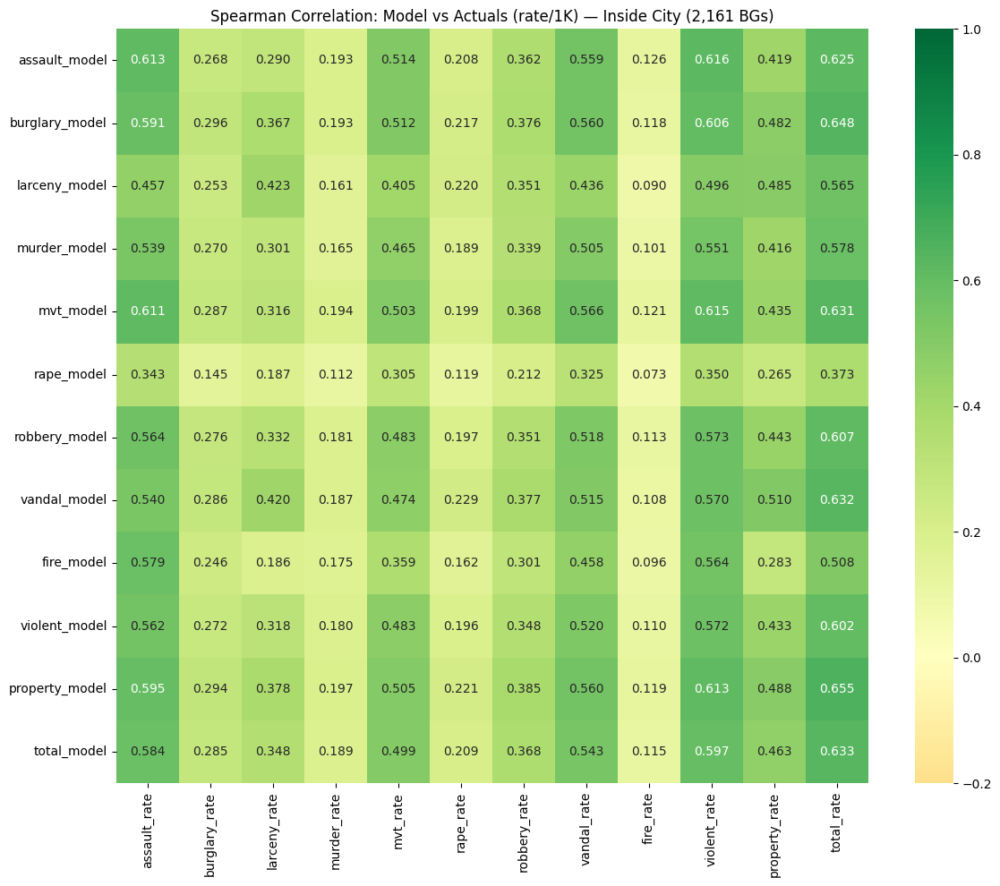


Same-category Spearman correlations — normalized (Inside City):
     assault: 0.613
    burglary: 0.296
     larceny: 0.423
      murder: 0.165
         mvt: 0.503
        rape: 0.119
     robbery: 0.351
      vandal: 0.515
        fire: 0.096
     violent: 0.572
    property: 0.488
       total: 0.633


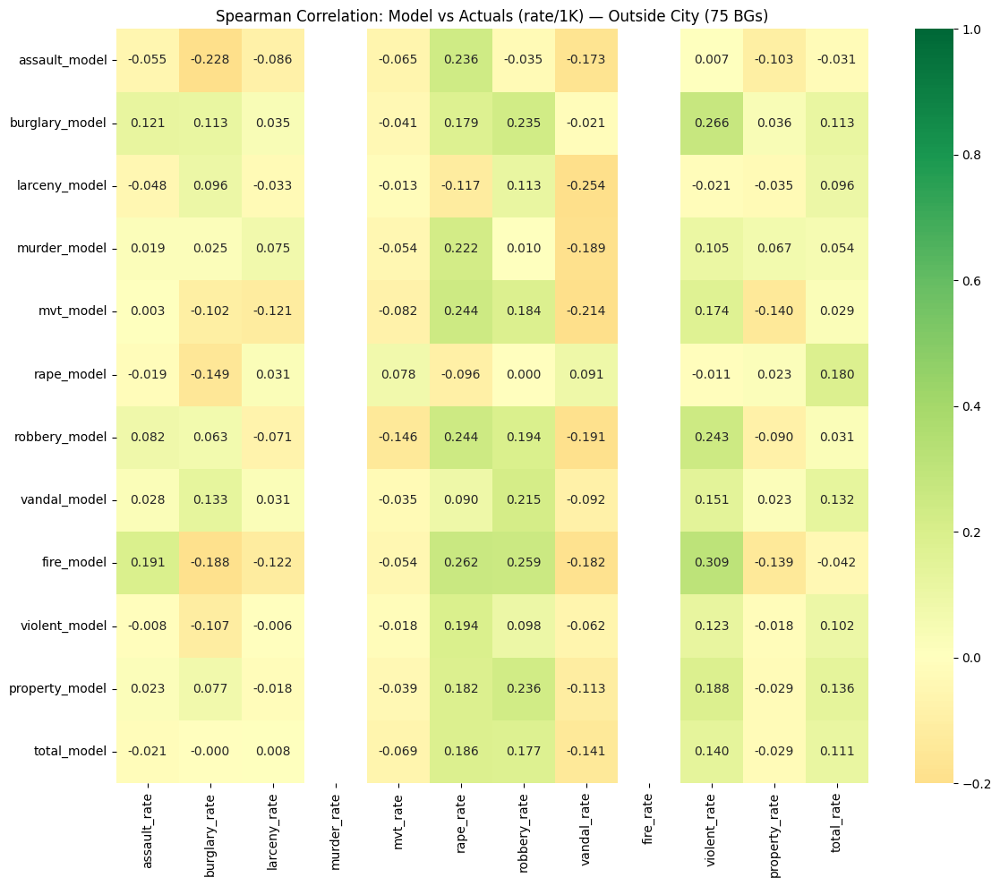


Same-category Spearman correlations — normalized (Outside City):
     assault: -0.055
    burglary: 0.113
     larceny: -0.033
      murder: nan
         mvt: -0.082
        rape: -0.096
     robbery: 0.194
      vandal: -0.092
        fire: nan
     violent: 0.123
    property: -0.029
       total: 0.111


In [18]:
# Spearman correlation heatmaps: model vs NORMALIZED actuals (rate per 1K)
for scope in ['all', 'inside', 'outside']:
    plot_correlation_heatmap_normalized(comparison, block_groups=scope)

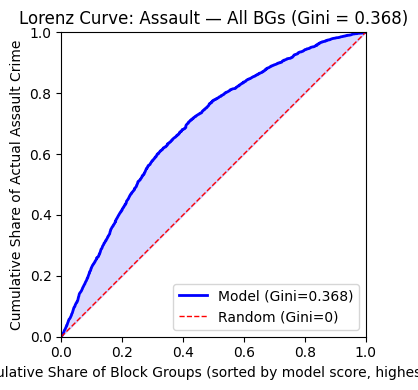


Gini coefficient: 0.368

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%            11.2%              2.2x
     10%            22.9%              2.3x
     20%            41.7%              2.1x
     30%            57.9%              1.9x
     50%            77.6%              1.6x
  To capture 50% of assault: need top 24.9% of BGs
  To capture 80% of assault: need top 53.8% of BGs


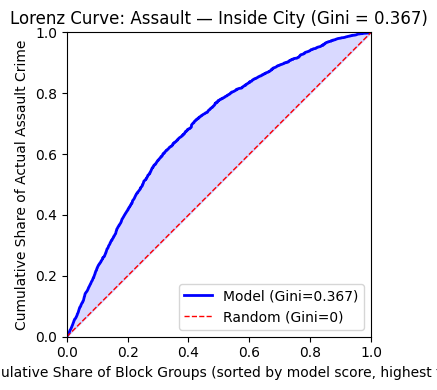


Gini coefficient: 0.367

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%            11.1%              2.2x
     10%            22.6%              2.3x
     20%            41.4%              2.1x
     30%            57.9%              1.9x
     50%            77.7%              1.6x
  To capture 50% of assault: need top 25.0% of BGs
  To capture 80% of assault: need top 53.7% of BGs


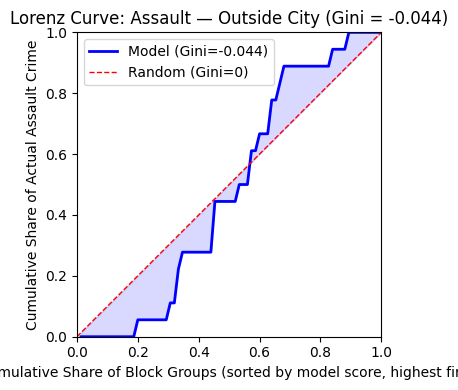


Gini coefficient: -0.044

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             0.0%              0.0x
     10%             0.0%              0.0x
     20%             5.6%              0.3x
     30%             5.6%              0.2x
     50%            44.4%              0.9x
  To capture 50% of assault: need top 53.3% of BGs
  To capture 80% of assault: need top 66.7% of BGs


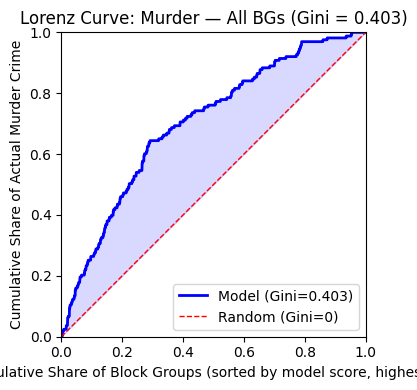


Gini coefficient: 0.403

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%            16.0%              3.2x
     10%            26.4%              2.6x
     20%            46.0%              2.3x
     30%            64.4%              2.1x
     50%            76.1%              1.5x
  To capture 50% of murder: need top 22.3% of BGs
  To capture 80% of murder: need top 55.9% of BGs


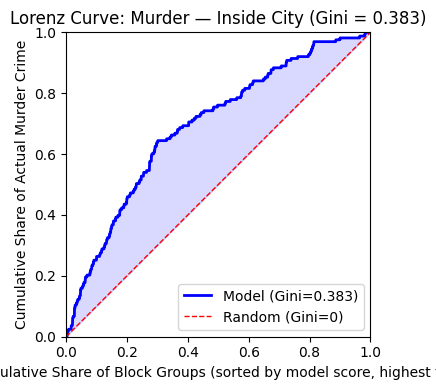


Gini coefficient: 0.383

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%            16.0%              3.2x
     10%            25.2%              2.5x
     20%            45.4%              2.3x
     30%            63.8%              2.1x
     50%            76.1%              1.5x
  To capture 50% of murder: need top 23.1% of BGs
  To capture 80% of murder: need top 57.7% of BGs
No actual murder crimes — can't compute Lorenz curve.


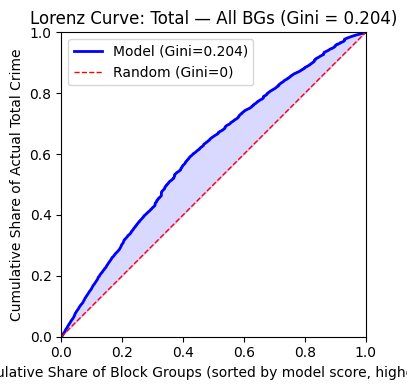


Gini coefficient: 0.204

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             8.2%              1.6x
     10%            15.8%              1.6x
     20%            30.4%              1.5x
     30%            42.4%              1.4x
     50%            65.8%              1.3x
  To capture 50% of total: need top 34.7% of BGs
  To capture 80% of total: need top 67.8% of BGs


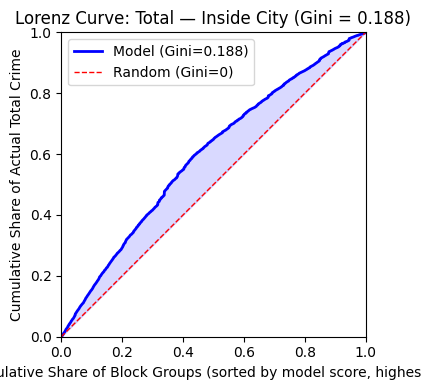


Gini coefficient: 0.188

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             8.1%              1.6x
     10%            15.4%              1.5x
     20%            29.2%              1.5x
     30%            41.6%              1.4x
     50%            64.9%              1.3x
  To capture 50% of total: need top 35.6% of BGs
  To capture 80% of total: need top 69.3% of BGs


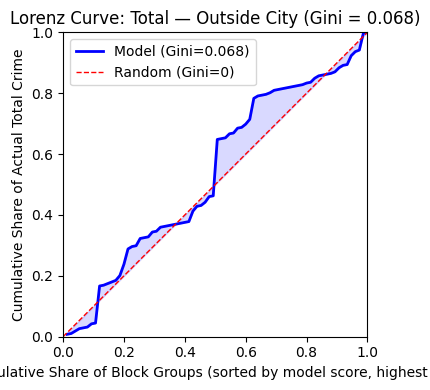


Gini coefficient: 0.068

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             1.9%              0.4x
     10%             4.2%              0.4x
     20%            23.8%              1.2x
     30%            34.4%              1.1x
     50%            46.3%              0.9x
  To capture 50% of total: need top 50.7% of BGs
  To capture 80% of total: need top 68.0% of BGs


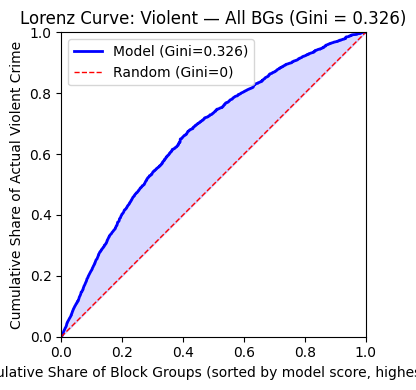


Gini coefficient: 0.326

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%            10.9%              2.2x
     10%            21.9%              2.2x
     20%            40.3%              2.0x
     30%            53.9%              1.8x
     50%            73.5%              1.5x
  To capture 50% of violent: need top 27.2% of BGs
  To capture 80% of violent: need top 59.1% of BGs


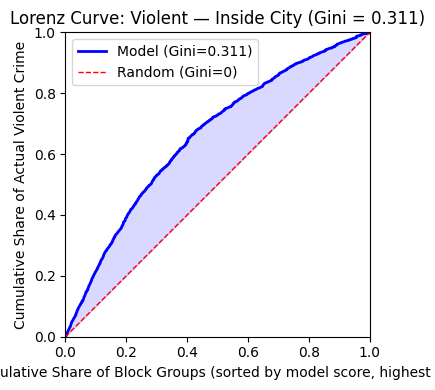


Gini coefficient: 0.311

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%            10.8%              2.2x
     10%            21.5%              2.2x
     20%            39.0%              2.0x
     30%            53.1%              1.8x
     50%            72.8%              1.5x
  To capture 50% of violent: need top 27.9% of BGs
  To capture 80% of violent: need top 60.3% of BGs


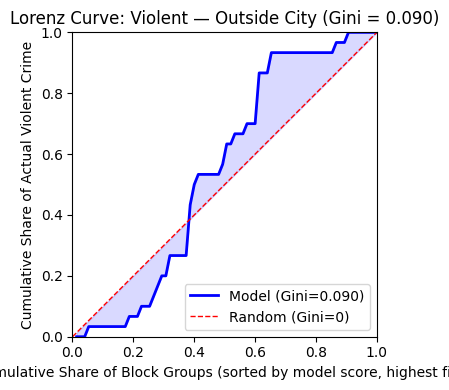


Gini coefficient: 0.090

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             0.0%              0.0x
     10%             3.3%              0.3x
     20%             6.7%              0.3x
     30%            20.0%              0.7x
     50%            56.7%              1.1x
  To capture 50% of violent: need top 40.0% of BGs
  To capture 80% of violent: need top 61.3% of BGs


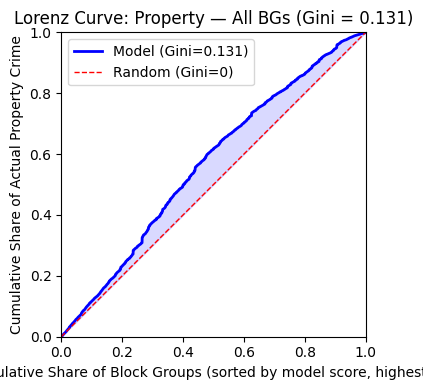


Gini coefficient: 0.131

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             5.8%              1.2x
     10%            11.6%              1.2x
     20%            23.2%              1.2x
     30%            37.5%              1.3x
     50%            61.6%              1.2x
  To capture 50% of property: need top 40.2% of BGs
  To capture 80% of property: need top 71.2% of BGs


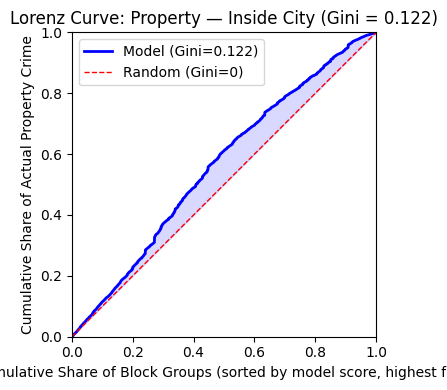


Gini coefficient: 0.122

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             5.7%              1.1x
     10%            11.5%              1.1x
     20%            22.4%              1.1x
     30%            37.1%              1.2x
     50%            61.1%              1.2x
  To capture 50% of property: need top 40.9% of BGs
  To capture 80% of property: need top 71.7% of BGs


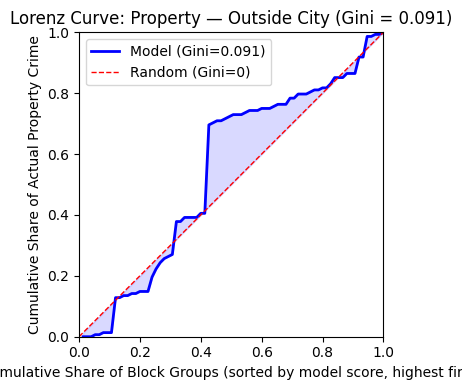


Gini coefficient: 0.091

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             0.0%              0.0x
     10%             1.4%              0.1x
     20%            14.9%              0.7x
     30%            26.4%              0.9x
     50%            72.3%              1.4x
  To capture 50% of property: need top 42.7% of BGs
  To capture 80% of property: need top 76.0% of BGs


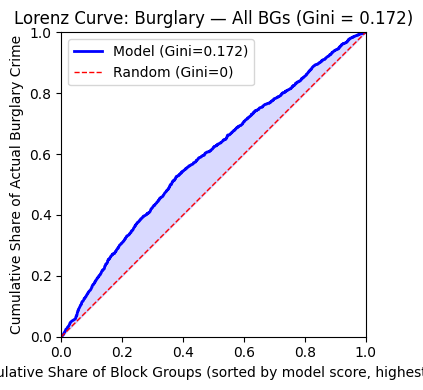


Gini coefficient: 0.172

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             6.9%              1.4x
     10%            16.1%              1.6x
     20%            30.9%              1.5x
     30%            42.4%              1.4x
     50%            62.1%              1.2x
  To capture 50% of burglary: need top 36.0% of BGs
  To capture 80% of burglary: need top 72.6% of BGs


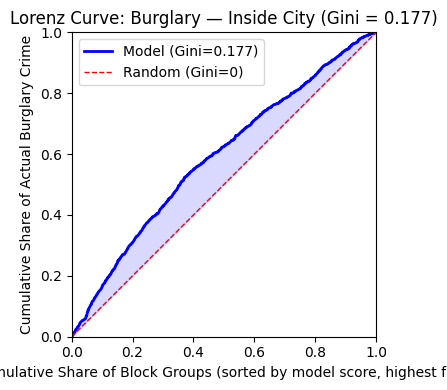


Gini coefficient: 0.177

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             7.2%              1.4x
     10%            16.5%              1.7x
     20%            31.0%              1.5x
     30%            42.9%              1.4x
     50%            62.5%              1.3x
  To capture 50% of burglary: need top 35.6% of BGs
  To capture 80% of burglary: need top 72.3% of BGs


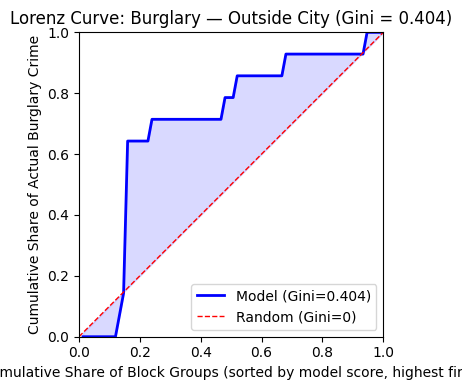


Gini coefficient: 0.404

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             0.0%              0.0x
     10%             0.0%              0.0x
     20%            64.3%              3.2x
     30%            71.4%              2.4x
     50%            78.6%              1.6x
  To capture 50% of burglary: need top 16.0% of BGs
  To capture 80% of burglary: need top 52.0% of BGs


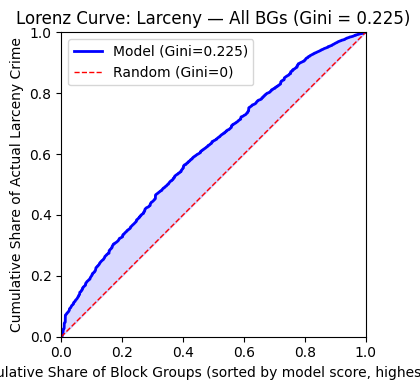


Gini coefficient: 0.225

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%            12.3%              2.5x
     10%            20.0%              2.0x
     20%            32.8%              1.6x
     30%            44.4%              1.5x
     50%            64.3%              1.3x
  To capture 50% of larceny: need top 34.9% of BGs
  To capture 80% of larceny: need top 67.7% of BGs


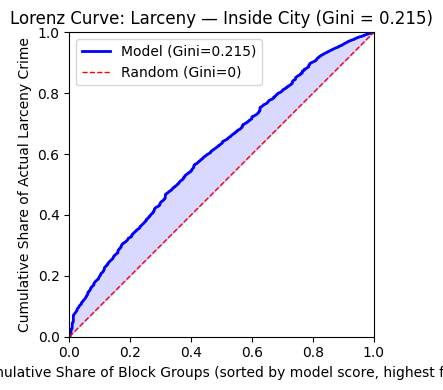


Gini coefficient: 0.215

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%            12.4%              2.5x
     10%            19.9%              2.0x
     20%            32.6%              1.6x
     30%            44.1%              1.5x
     50%            63.5%              1.3x
  To capture 50% of larceny: need top 35.4% of BGs
  To capture 80% of larceny: need top 68.7% of BGs


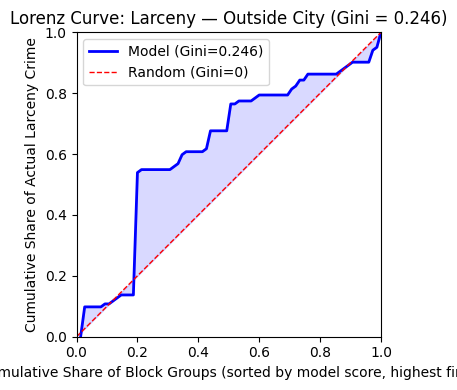


Gini coefficient: 0.246

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             9.8%              2.0x
     10%            10.8%              1.1x
     20%            53.9%              2.7x
     30%            54.9%              1.8x
     50%            67.6%              1.4x
  To capture 50% of larceny: need top 20.0% of BGs
  To capture 80% of larceny: need top 70.7% of BGs


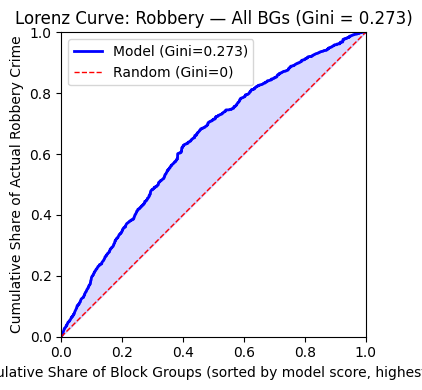


Gini coefficient: 0.273

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             9.3%              1.9x
     10%            19.6%              2.0x
     20%            34.7%              1.7x
     30%            48.4%              1.6x
     50%            71.5%              1.4x
  To capture 50% of robbery: need top 31.9% of BGs
  To capture 80% of robbery: need top 61.7% of BGs


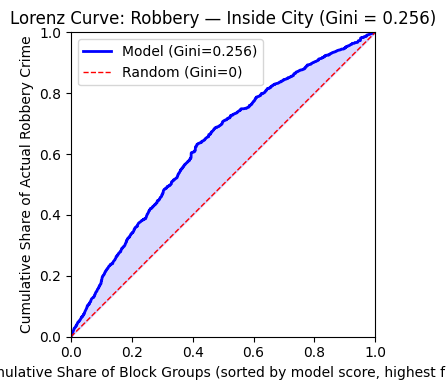


Gini coefficient: 0.256

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             9.0%              1.8x
     10%            18.4%              1.8x
     20%            34.0%              1.7x
     30%            46.7%              1.6x
     50%            70.8%              1.4x
  To capture 50% of robbery: need top 32.8% of BGs
  To capture 80% of robbery: need top 63.1% of BGs


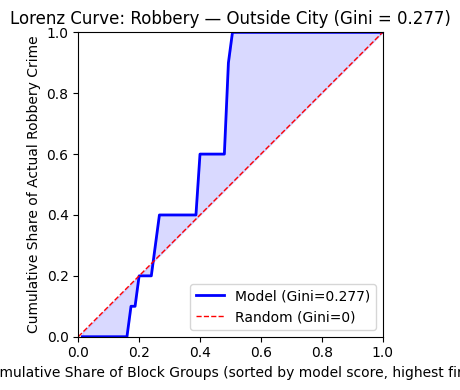


Gini coefficient: 0.277

   Top %   Crime Captured   Lift vs Random
--------------------------------------------
      5%             0.0%              0.0x
     10%             0.0%              0.0x
     20%            20.0%              1.0x
     30%            40.0%              1.3x
     50%            90.0%              1.8x
  To capture 50% of robbery: need top 40.0% of BGs
  To capture 80% of robbery: need top 49.3% of BGs


In [19]:
# Lorenz curves + Gini for key categories
categories = ['assault','murder','total', 'violent', 'property',  'burglary', 'larceny', 'robbery']
for cat in categories:
    for scope in ['all', 'inside', 'outside']:
        plot_lorenz_curve(comparison, crime_type=cat, block_groups=scope)

In [20]:
# Load and prep eval data
evals = load_evals()
evals = extract_bg_geoid(evals)
validate_block_cols(evals)

# Get list of carriers
carriers = evals['carrier'].unique().tolist()
print(f"Available carriers: {carriers}")

Evals loaded: 3,408,855 rows, 4 carriers
Carriers: {'TRAV': 2480028, 'Guard': 638020, 'HANO': 190239, 'OregonMutal': 100568}
Extracted bg_geoid from crime_censusblock. Sample: ['060530140001', '530250111022', '530250111022']
Block column match rate: 100.0%
Available carriers: ['OregonMutal', 'Guard', 'TRAV', 'HANO']


In [21]:
# Aggregate per carrier and merge with city crime data
carrier_name = 'Guard'  # Change per carrier
eval_bg = aggregate_evals_to_bg(evals, carrier=carrier_name)
eval_crime = merge_evals_with_crime(eval_bg, bg_all)

Carrier 'Guard': 626,807 rows → 81,418 block groups
  Total exposure: 571,034
  Total claims: 5,394
  Total losses: 65,420,426
Merged: 1,351 of 81,418 eval BGs matched to city crime data (1.7%)


In [22]:
# Shape of the comparison dataframe
print(f"Total Block groups in our analysis set in {city}: {comparison.shape[0]} groups")
print(f"Out of total, inside city bgs: {comparison[comparison['within_city']==True].shape[0]} groups")
print(f"Out of total, matched with carrier data: {eval_crime.shape[0]} groups")
print(f"Out of matched, inside city bgs: {eval_crime[eval_crime['within_city']==True].shape[0]} groups")

Total Block groups in our analysis set in chicago: 2239 groups
Out of total, inside city bgs: 2164 groups
Out of total, matched with carrier data: 1351 groups
Out of matched, inside city bgs: 1305 groups


##### Common terms used in carrier evalauations:
1. Earned Exposure: Corresponds to one policy in one year. Decimal values represent partial coverage. Rare negative values are an artifact of the carrier's accounting should be excluded from analaysis
2. Premium: The policy premium paid by the insured for the corresponding earned exposure (When earned expsore = 1 premium is the annual premium)
3. Claims: The count of claims paid by the insurance carrier for given loss perils (e.g. theft claims represent all claims where the cause of loss is theft)
4. Losses: The $ amount paid out by the carrier for given loss perils (e.g. theft loss is the amount paid by the carrier where cause of loss is theft)
5. Crime Loss Types:
Theft and Vandalism are the common loss types associated with property insurance
Losses associated with violent crime can take the form of liability losses (e.g. a property owner is sued after a violent crime on their property). We recieve these loses more rarely in carrier evals but they can be very high $ amounts (not included in the evals below).

In [23]:
# Examine eval df
eval_crime.info()

<class 'pandas.DataFrame'>
RangeIndex: 1351 entries, 0 to 1350
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   bg_geoid          1351 non-null   str     
 1   earned_exposures  1351 non-null   float64 
 2   crime_claims      1351 non-null   float64 
 3   crime_loss        1351 non-null   float64 
 4   total_claims      1351 non-null   float64 
 5   total_losses      1351 non-null   float64 
 6   geoid             1351 non-null   str     
 7   within_city       1351 non-null   bool    
 8   geometry          1351 non-null   geometry
 9   bg_key            1350 non-null   str     
 10  total_count       1351 non-null   float64 
 11  assault_count     1351 non-null   float64 
 12  burglary_count    1351 non-null   float64 
 13  fire_count        1351 non-null   float64 
 14  larceny_count     1351 non-null   float64 
 15  murder_count      1351 non-null   float64 
 16  mvt_count         1351 non-null   f

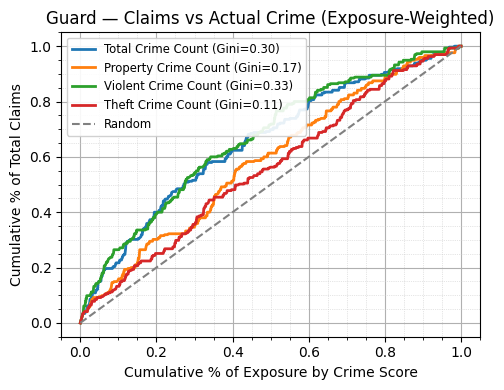

{'total_count': np.float64(0.30238225898889315),
 'property_count': np.float64(0.1676879483706828),
 'violent_count': np.float64(0.3302871991329319),
 'larceny_count': np.float64(0.11438643188503361)}

In [24]:
# Lorenz curves: sort by actual city crime, measure claims concentration
risk_scores = {
    'total_count': 'Total Crime Count',
    'property_count': 'Property Crime Count',
    'violent_count': 'Violent Crime Count',
    'larceny_count': 'Theft Crime Count',
}

# Exposure-weighted BGs
plot_carrier_lorenz_multi(
    eval_crime, 
    risk_score_cols=list(risk_scores.keys()),
    outcome_col='total_claims',
    x_axis='exposure_weighted',
    labels=risk_scores,
    title=f'{carrier_name} — Claims vs Actual Crime (Exposure-Weighted)'
)

# Equal-weight BGs (crime data validation)
#plot_carrier_lorenz_multi(
#    eval_crime,
#    risk_score_cols=list(risk_scores.keys()),
#    outcome_col='total_claims',
#    x_axis='equal_weight',
#    labels=risk_scores,
#    title=f'{carrier_name} — Claims vs Actual Crime (Equal-Weight BGs)'
#)

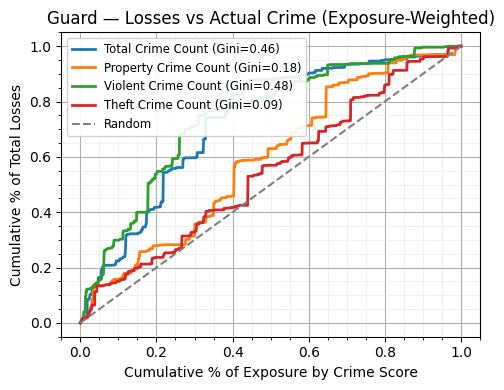

{'total_count': np.float64(0.4554940770761322),
 'property_count': np.float64(0.1803279484956115),
 'violent_count': np.float64(0.4844498830059778),
 'larceny_count': np.float64(0.09173661589586035)}

In [25]:
# Repeat for losses
plot_carrier_lorenz_multi(
    eval_crime,
    risk_score_cols=list(risk_scores.keys()),
    outcome_col='total_losses',
    x_axis='exposure_weighted',
    labels=risk_scores,
    title=f'{carrier_name} — Losses vs Actual Crime (Exposure-Weighted)'
)

In [26]:
# Correlation: Spearman between city crime counts and carrier claims/losses
from scipy.stats import spearmanr

crime_cols = ['total_count', 'property_count', 'violent_count', 'larceny_count', 'burglary_count']
outcome_cols = ['total_claims','total_losses']

corr_data = []
for crime_col in crime_cols:
    for out_col in outcome_cols:
        valid = eval_crime[[crime_col, out_col]].dropna()
        if len(valid) > 10:
            rho, pval = spearmanr(valid[crime_col], valid[out_col])
            corr_data.append({'crime': crime_col, 'outcome': out_col, 'spearman_rho': rho, 'p_value': pval})

corr_df = pd.DataFrame(corr_data)
print(corr_df.pivot(index='crime', columns='outcome', values='spearman_rho').round(3))

outcome         total_claims  total_losses
crime                                     
burglary_count         0.064         0.064
larceny_count          0.089         0.090
property_count         0.104         0.106
total_count            0.162         0.165
violent_count          0.167         0.170


#### Fun Experiment

In [31]:
# 1. Get cluster labels from inside_bgs onto eval_crime
cluster_labels = inside_bgs[['geoid', 'cluster']].copy()
eval_crime_clustered = eval_crime.merge(cluster_labels, on='geoid', how='left')

print(eval_crime_clustered['cluster'].value_counts())

# 2. Compute Lorenz Gini within each cluster
def compute_lorenz_gini(df, sort_col, outcome_col):
    """Gini from Lorenz curve: sort by sort_col, cumulate outcome_col."""
    valid = df[[sort_col, outcome_col]].dropna()
    valid = valid[valid[outcome_col] > 0]  # need some outcome to measure
    if len(valid) < 10:
        return np.nan
    valid = valid.sort_values(sort_col)
    cumulative = valid[outcome_col].cumsum() / valid[outcome_col].sum()
    n = len(cumulative)
    lorenz_area = cumulative.sum() / n
    return 2 * (lorenz_area - 0.5)

# 3. Full dataset Gini (what you already have)
gini_all = compute_lorenz_gini(eval_crime_clustered, 'total_count', 'total_losses')

# 4. Within-cluster Ginis
for cluster_name in ['HH (Hot Spot)', 'LL (Cold Spot)', 'Not Significant']:
    subset = eval_crime_clustered[eval_crime_clustered['cluster'] == cluster_name]
    g = compute_lorenz_gini(subset, 'total_count', 'total_losses')
    print(f"{cluster_name:<20} n={len(subset):>4}  Gini={g:.3f}")

print(f"\n{'ALL BGs':<20} n={len(eval_crime_clustered):>4}  Gini={gini_all:.3f}")

cluster
Not Significant    928
LL (Cold Spot)     169
HH (Hot Spot)      136
LH                  57
HL                  15
Name: count, dtype: int64
HH (Hot Spot)        n= 136  Gini=0.302
LL (Cold Spot)       n= 169  Gini=-0.158
Not Significant      n= 928  Gini=-0.085

ALL BGs              n=1351  Gini=-0.203
